# <center>CSE 4/546: Reinforcement Learning</center>
## <center>Instructor: Prof. Alina Vereshchaka</center>
## <center>Anip KUmar Paul</center>
### <center>Assignment 1, Part 3</center>

In [2]:
! pip install gymnasium matplotlib numpy

In [3]:
!pip install imageio
!pip install tqdm

In [70]:
# Imports
import gymnasium
from gymnasium import spaces
import math
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import os
import imageio
from tqdm import tqdm
import pandas as pd
import h5py

In [42]:
file_path = '/Users/anip/Desktop/anipkuma_assignment1_checkpoint/NVDA.csv'
stock_data = pd.read_csv(file_path)

print(stock_data.head(5))

         Date    Open       High     Low   Close  Adj Close     Volume
0  2022-07-01  14.899  15.063000  14.392  14.523  14.506663  577610000
1  2022-07-05  14.175  14.971000  14.055  14.964  14.947166  651397000
2  2022-07-06  15.010  15.319000  14.789  15.130  15.112980  529066000
3  2022-07-07  15.456  15.945000  15.389  15.858  15.840160  492903000
4  2022-07-08  15.430  16.037001  15.389  15.838  15.820185  467972000


### Stock Trading Environment 

In [43]:
# Defining the Stock Trading Environment.
"""DON'T MAKE ANY CHANGES TO THE ENVIRONMENT."""


class StockTradingEnvironment(gymnasium.Env):
    """This class implements the Stock Trading environment."""

    def __init__(self, file_path, train=True, number_of_days_to_consider=10):
        """This method initializes the environment.

        :param file_path: - Path of the CSV file containing the historical stock data.
        :param train: - Boolean indicating whether the goal is to train or test the performance of the agent.
        :param number_of_days_to_consider = Integer representing the number of days the for which the agent
                considers the trend in stock price to make a decision."""

        self.file_path = '/Users/anip/Desktop/anipkuma_assignment1_checkpoint/NVDA.csv'
        self.stock_data = pd.read_csv(self.file_path)
        self.train = train

        # Splitting the data into train and test datasets.
        self.training_stock_data = self.stock_data.iloc[:int(0.8 * len(self.stock_data))]
        self.testing_stock_data = self.stock_data.iloc[int(0.8 * len(self.stock_data)):].reset_index()

        self.observation_space = spaces.Discrete(4)
        self.action_space = spaces.Discrete(3)

        self.investment_capital = 100000  # This defines the investment capital that the agent starts with.
        self.number_of_shares = 0  # This defines number of shares currently held by the agent.
        self.stock_value = 0  # This defines the value of the stock currently held by the agent.
        self.book_value = 0  # This defines the total value for which the agent bought the shares.
        # This defines the agent's total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # List to store the total account value over training or evaluation.
        self.total_account_value_list = []
        # This defines the number of days for which the agent considers the data before taking an action.
        self.number_of_days_to_consider = number_of_days_to_consider
        # The maximum timesteps the agent will take before the episode ends.
        if self.train:
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider
        else:
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider
        # Initializing the number of steps taken to 0.
        self.timestep = 0
        self.reset()

    def reset(self):
        """This method resets the environment and returns the observation.

        :returns observation: - Integer in the range of 0 to 3 representing the four possible observations that the
                                agent can receive. The observation depends upon whether the price increased on average
                                in the number of days the agent considers, and whether the agent already has the stock
                                or not.

         info: - A dictionary that can be used to provide additional implementation information."""

        self.investment_capital = 100000  # This defines the investment capital that the agent starts with.
        self.number_of_shares = 0  # This defines number of shares currently held by the agent.
        self.stock_value = 0  # This defines the value of the stock currently held by the agent.
        self.book_value = 0  # This defines the total value for which the agent bought the shares.
        # This defines the agent's total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # List to store the total account value over training or evaluation.
        self.total_account_value_list = []
        # Initializing the number of steps taken to 0.
        self.timestep = 0

        # Getting the observation vector.
        if self.train:
            # If the task is to train the agent the maximum timesteps will be equal to the number of days considered
            # subtracted from the  length of the training stock data.
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.training_stock_data['Close'][self.timestep + 1 + i] \
                        - self.training_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            stock_held = False

            # Observation vector that will be passed to the agent.
            observation = [price_increase, stock_held]

        else:
            # If the task is to evaluate the trained agent's performance the maximum timesteps will be equal to the
            # number of days considered subtracted from the  length of the testing stock data.
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.testing_stock_data['Close'][self.timestep + 1 + i] \
                        - self.testing_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            stock_held = False

            # Observation vector.
            observation = [price_increase, stock_held]

        if np.array_equal(observation, [True, False]):
            observation = 0
        if np.array_equal(observation, [True, True]):
            observation = 1
        if np.array_equal(observation, [False, False]):
            observation = 2
        if np.array_equal(observation, [False, True]):
            observation = 3

        info = None

        return observation, info

    def step(self, action):
        """This method implements what happens when the agent takes the action to Buy/Sell/Hold.

        :param action: - Integer in the range 0 to 2 inclusive.

        :returns observation: - Integer in the range of 0 to 3 representing the four possible observations that the
                                agent can receive. The observation depends upon whether the price increased on average
                                in the number of days the agent considers, and whether the agent already has the stock
                                or not.
                 reward: - Integer/Float value that's used to measure the performance of the agent.
                 terminated: - Boolean describing whether the episode has terminated.
                 truncated: - Boolean describing whether a truncation condition outside the scope of the MDP is satisfied.
                 info: - A dictionary that can be used to provide additional implementation information."""

        # We give the agent a penalty for taking actions such as buying a stock when the agent doesn't have the
        # investment capital and selling a stock when the agent doesn't have any shares.
        penalty = 0

        if self.train:
            if action == 0:  # Buy
                if self.number_of_shares > 0:
                    penalty = -10
                # Determining the number of shares the agent can buy.
                number_of_shares_to_buy = math.floor(self.investment_capital / self.training_stock_data[
                    'Open'][self.timestep + self.number_of_days_to_consider])
                # Adding to the number of shares the agent has.
                self.number_of_shares += number_of_shares_to_buy

                # Computing the stock value, book value, investment capital and reward.
                if number_of_shares_to_buy > 0:
                    self.stock_value +=\
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.book_value += \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider]\
                        * number_of_shares_to_buy
                    self.investment_capital -= \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy

                    reward = 1 + penalty

                else:
                    # Computing the stock value and reward.
                    self.stock_value = \
                        self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * self.number_of_shares
                    reward = -10

            if action == 1:  # Sell
                # Computing the investment capital, sell value and reward.
                self.investment_capital += \
                    self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                    * self.number_of_shares
                sell_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                             * self.number_of_shares

                if self.book_value > 0:
                    reward = (sell_value - self.book_value) / self.book_value * 100
                else:
                    reward = -10

                self.number_of_shares = 0
                self.stock_value = 0
                self.book_value = 0

            if action == 2:  # Hold
                # Computing the stock value and reward.
                self.stock_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                                   * self.number_of_shares

                if self.book_value > 0:
                    reward = (self.stock_value - self.book_value) / self.book_value * 100
                else:
                    reward = -1

        else:
            if action == 0:  # Buy
                if self.number_of_shares > 0:
                    penalty = -10
                # Determining the number of shares the agent can buy.
                number_of_shares_to_buy = math.floor(self.investment_capital / self.testing_stock_data[
                    'Open'][self.timestep + self.number_of_days_to_consider])
                # Adding to the number of shares the agent has.
                self.number_of_shares += number_of_shares_to_buy

                # Computing the stock value, book value, investment capital and reward.
                if number_of_shares_to_buy > 0:
                    self.stock_value += \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.book_value += \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy
                    self.investment_capital -= \
                        self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                        * number_of_shares_to_buy

                    reward = 1 + penalty

                else:
                    # Computing the stock value and reward.
                    self.stock_value = self.training_stock_data['Open'][
                                           self.timestep + self.number_of_days_to_consider] * self.number_of_shares
                    reward = -10

            if action == 1:  # Sell
                # Computing the investment capital, sell value and reward.
                self.investment_capital += \
                    self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                    * self.number_of_shares
                sell_value = self.training_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                             * self.number_of_shares

                if self.book_value > 0:
                    reward = (sell_value - self.book_value) / self.book_value * 100
                else:
                    reward = -10

                self.number_of_shares = 0
                self.stock_value = 0
                self.book_value = 0

            if action == 2:  # Hold
                # Computing the stock value and reward.
                self.stock_value = self.testing_stock_data['Open'][self.timestep + self.number_of_days_to_consider] \
                                   * self.number_of_shares

                if self.book_value > 0:
                    reward = (self.stock_value - self.book_value) / self.book_value * 100
                else:
                    reward = -1

        # Determining if the agent currently has shares of the stock or not.
        if self.number_of_shares > 0:
            stock_held = True
        else:
            stock_held = False

        # Getting the observation vector.
        if self.train:
            # If the task is to train the agent the maximum timesteps will be equal to the number of days considered
            # subtracted from the  length of the training stock data.
            self.max_timesteps = len(self.training_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.training_stock_data['Close'][self.timestep + 1 + i] \
                        - self.training_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            # Observation vector.
            observation = [price_increase, stock_held]

        else:
            # If the task is to evaluate the trained agent's performance the maximum timesteps will be equal to the
            # number of days considered subtracted from the  length of the testing stock data.
            self.max_timesteps = len(self.testing_stock_data) - self.number_of_days_to_consider

            # Calculating whether the price increased or decreased/remained the same on the majority of days the agent
            # considers.
            price_increase_list = []
            for i in range(self.number_of_days_to_consider):
                if self.testing_stock_data['Close'][self.timestep + 1 + i] \
                        - self.testing_stock_data['Close'][self.timestep + i] > 0:
                    price_increase_list.append(1)
                else:
                    price_increase_list.append(0)

            if (np.sum(price_increase_list) / self.number_of_days_to_consider) >= 0.5:
                price_increase = True
            else:
                price_increase = False

            # Observation vector.
            observation = [price_increase, stock_held]

        self.timestep += 1  # Increasing the number of steps taken by the agent by 1.

        if np.array_equal(observation, [True, False]):
            observation = 0
        if np.array_equal(observation, [True, True]):
            observation = 1
        if np.array_equal(observation, [False, False]):
            observation = 2
        if np.array_equal(observation, [False, True]):
            observation = 3

        # Computing the total account value.
        self.total_account_value = self.investment_capital + self.stock_value
        # Appending the total account value of the list to plot the graph.
        self.total_account_value_list.append(self.total_account_value)

        # The episode terminates when the maximum timesteps have been reached.
        terminated = True if (self.timestep >= self.max_timesteps) \
            else False
        truncated = False
        info = {}

        return observation, reward, terminated, truncated, info

    def render(self, mode='human'):
        """This method renders the agent's total account value over time.

        :param mode: 'human' renders to the current display or terminal and returns nothing."""

        plt.figure(figsize=(15, 10))
        plt.plot(self.total_account_value_list, color='lightseagreen', linewidth=7)
        plt.xlabel('Days', fontsize=32)
        plt.ylabel('Total Account Value', fontsize=32)
        plt.title('Total Account Value over Time', fontsize=38)
        plt.grid()
        plt.show()

### Q-learning algorithm Implementation

In [91]:
class StockTradingQLearning:
    def __init__(self, env, learning_rate=0.1, discount_rate=0.99, epsilon=1.0, epsilon_decay=0.995, min_epsilon=0.01):
        """
        Initializes the Q-learning agent for the stock trading environment.
        """
        self.env = env  
        self.learning_rate = learning_rate
        self.discount_rate = discount_rate
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.min_epsilon = min_epsilon
        self.state_space_size = env.observation_space.n  
        self.action_space_size = env.action_space.n  
        self.Q_table = np.zeros((self.state_space_size, self.action_space_size))  
        #self.Q_table = np.zeros((state_space_size, action_space_size))  

    def choose_action(self, state):
        """Chooses an action using the epsilon-greedy policy."""
        if np.random.random() < self.epsilon:
            return self.env.action_space.sample() 
        else:
            return np.argmax(self.Q_table[state]) 

    def update(self, state, action, reward, next_state):
        """Updates the Q-value for the given state-action pair using the Q-learning formula."""
        best_next_action = np.argmax(self.Q_table[next_state])
        td_target = reward + self.discount_rate * self.Q_table[next_state, best_next_action]
        td_error = td_target - self.Q_table[state, action]
        self.Q_table[state, action] += self.learning_rate * td_error

    def update_epsilon(self):
        """Updates the epsilon value after each episode to reduce exploration."""
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

    def save_q_table(self, filename="stock_q_table.pkl"):
        """Saves the Q-table to a file for future use."""
        with open(filename, 'wb') as f:
            pickle.dump(self.Q_table, f)

    def load_q_table(self, filename="stock_q_table.pkl"):
        """Loads the Q-table from a file."""
        with open(filename, 'rb') as f:
            self.Q_table = pickle.load(f)


In [92]:
def train_stock(agent, env, episodes, steps, epsilon, discount_rate, learning_rate, record_video=False, env_render=False):
    """
    Trains the agent using the epsilon-greedy strategy in the stock trading environment.
    Returns:
        dict: Training results including total reward, number of steps, and final portfolio value.
    """
    
    results = {
        'total_reward': [],
        'steps_taken': [],
        'final_portfolio_value': []
    }

    for episode in range(episodes):
        state, info = env.reset()  
        
        terminated = False
        total_reward = 0
        steps_count = 0

        for step in range(steps):
            action = agent.choose_action(state)

            new_state, reward, terminated, truncated, new_info = env.step(action)
            
            agent.update(state, action, reward, new_state)

            total_reward += reward
            steps_count += 1

            if terminated:
                break

            state = new_state

        agent.update_epsilon()

        final_portfolio_value = env.total_account_value 
        results['total_reward'].append(total_reward)
        results['steps_taken'].append(steps_count)
        results['final_portfolio_value'].append(final_portfolio_value)

        print(f"Episode {episode+1}/{episodes} - Total Reward: {total_reward}, Final Portfolio Value: {final_portfolio_value}")

    return results


In [144]:
if __name__ == "__main__":
    # Link the CSV file path
    file_path = '/Users/anip/Desktop/anipkuma_assignment1_checkpoint/NVDA.csv'

    env = StockTradingEnvironment(file_path=file_path, train=True, number_of_days_to_consider=10)
    agent = StockTradingQLearning(env)
    num_episodes = 500

    # Training loop
    for episode_no in range(num_episodes):
        total_reward, steps_taken, final_portfolio_value = train(agent, env, 
                                                                 episodes=episode_no, 
                                                                 steps=steps_per_episode, 
                                                                 epsilon=agent.epsilon,
                                                                 discount_rate=0.99, 
                                                                 learning_rate=0.1, 
                                                                 record_video=False, 
                                                                 env_render=False)

        agent.update_epsilon()

        print(f"Episode {episode_no + 1}: Total Reward: {total_reward}, Final Portfolio Value: ${final_portfolio_value}")

    # Save the trained Q-table after completing the end of the training process
    agent.save_q_table("stock_trading_q_table.pkl")


Episode 1: Total Reward: total_reward, Final Portfolio Value: $final_portfolio_value
Episode 1/1 - Total Reward: -252.45314971028023, Final Portfolio Value: 116100.38665700004
Episode 2: Total Reward: total_reward, Final Portfolio Value: $final_portfolio_value
Episode 1/2 - Total Reward: -316.4329995556776, Final Portfolio Value: 92267.22415900002
Episode 2/2 - Total Reward: -331.2963456574665, Final Portfolio Value: 112454.937741
Episode 3: Total Reward: total_reward, Final Portfolio Value: $final_portfolio_value
Episode 1/3 - Total Reward: -317.39979546941316, Final Portfolio Value: 119117.08338
Episode 2/3 - Total Reward: -299.4918518867215, Final Portfolio Value: 95828.68243799997
Episode 3/3 - Total Reward: -351.5090052383436, Final Portfolio Value: 90042.28514199995
Episode 4: Total Reward: total_reward, Final Portfolio Value: $final_portfolio_value
Episode 1/4 - Total Reward: -290.8300260322494, Final Portfolio Value: 98951.15352399989
Episode 2/4 - Total Reward: -268.1941467020

# Episode Training

In [145]:
def episode_trainer(file_path, episodes, steps, discount_rate, learning_rate, decay_rate=2, number_of_days_to_consider=10, is_training=True):
    """
    Trains or evaluates the Q-learning agent for stock trading over a specified number of episodes and steps.
    """
    max_epsilon = 1
    min_epsilon = 0.01
    timesteps = steps
    convert_to_video = False  
    
    total_rewards = []
    epsilon_values = []
    rewards_per_ep = {i: 0 for i in range(episodes)}

    env = StockTradingEnvironment(file_path=file_path, train=is_training, number_of_days_to_consider=number_of_days_to_consider)
    agent = StockTradingQLearning(env)  

    episode_steps_array = []

    for episode in tqdm(range(episodes), colour='green', desc='Training progress' if is_training else 'Evaluation progress', unit='Episode'):
        epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * (episode / episodes))
        epsilon_values.append(epsilon)

        episode_reward, episode_steps, final_portfolio_value = train_stock(agent, env, 
                                                                          episodes=1, 
                                                                          steps=timesteps, 
                                                                          epsilon=epsilon,
                                                                          discount_rate=discount_rate, 
                                                                          learning_rate=learning_rate,
                                                                          record_video=convert_to_video)

        rewards_per_ep[episode] = episode_reward
        total_rewards.append(episode_reward)
        episode_steps_array.append(episode_steps)

    rewards_per_ep_array = np.array(list(rewards_per_ep.values())).flatten()
    avg_rewards_over_eps = np.mean(rewards_per_ep_array)
    print("Rewards per Episodes:", rewards_per_ep)
    if is_training:
        print("Average Rewards over all Episodes (Training):", avg_rewards_over_eps)
    else:
        print("Average Rewards over all Episodes (Evaluation):", avg_rewards_over_eps)

    return rewards_per_ep, avg_rewards_over_eps, epsilon_values, agent


In [160]:
file_path = '/Users/anip/Desktop/anipkuma_assignment1_checkpoint/NVDA.csv'  

episodes = 1000
steps = 100
discount_rate = 0.99
learning_rate = 0.7
decay_rate = 2

rewards_per_ep, avg_rewards, epsilon_values, trained_agent = episode_trainer(file_path, episodes, steps, discount_rate, learning_rate, decay_rate, number_of_days_to_consider=10, is_training=True)


Training progress:   4%|▋               | 44/1000 [00:00<00:04, 209.31Episode/s]

Episode 1/1 - Total Reward: -436.00077574689334, Final Portfolio Value: 92440.17321300003
Episode 1/1 - Total Reward: -367.3398066489373, Final Portfolio Value: 107509.00435800002
Episode 1/1 - Total Reward: -309.08915741419446, Final Portfolio Value: 85099.52087199998
Episode 1/1 - Total Reward: -324.12677875829917, Final Portfolio Value: 101423.67811699996
Episode 1/1 - Total Reward: -314.8018260498582, Final Portfolio Value: 80860.34138899998
Episode 1/1 - Total Reward: -320.84954732236065, Final Portfolio Value: 81162.50352399997
Episode 1/1 - Total Reward: -307.3751116571139, Final Portfolio Value: 105251.791961
Episode 1/1 - Total Reward: -332.52926834893753, Final Portfolio Value: 84903.86071000001
Episode 1/1 - Total Reward: -149.92944683173266, Final Portfolio Value: 135845.871167
Episode 1/1 - Total Reward: -507.8496043157831, Final Portfolio Value: 81107.14943200002
Episode 1/1 - Total Reward: -240.58785587831244, Final Portfolio Value: 75539.91980099998
Episode 1/1 - Total 

Training progress:  11%|█▋             | 112/1000 [00:00<00:04, 217.99Episode/s]

Episode 1/1 - Total Reward: -245.90507584969197, Final Portfolio Value: 107600.55541799996
Episode 1/1 - Total Reward: -225.11915941374704, Final Portfolio Value: 102460.01467200002
Episode 1/1 - Total Reward: -171.63193897051306, Final Portfolio Value: 118768.64180499992
Episode 1/1 - Total Reward: -237.1291085773898, Final Portfolio Value: 101325.414675
Episode 1/1 - Total Reward: -133.2396033191006, Final Portfolio Value: 125948.31631000002
Episode 1/1 - Total Reward: -79.65475154998764, Final Portfolio Value: 128203.44460500003
Episode 1/1 - Total Reward: -54.5267751357323, Final Portfolio Value: 124273.97461599996
Episode 1/1 - Total Reward: -207.14571062865195, Final Portfolio Value: 147606.57871099995
Episode 1/1 - Total Reward: -240.22984137436183, Final Portfolio Value: 117827.82902199998
Episode 1/1 - Total Reward: -218.28440107358597, Final Portfolio Value: 107214.14894400012
Episode 1/1 - Total Reward: -41.7444622925974, Final Portfolio Value: 120239.82640299998
Episode 1/1

Training progress:  16%|██▎            | 156/1000 [00:00<00:03, 218.75Episode/s]

Episode 1/1 - Total Reward: -89.55818008590583, Final Portfolio Value: 115506.06711
Episode 1/1 - Total Reward: -57.01573300907848, Final Portfolio Value: 90879.23669199995
Episode 1/1 - Total Reward: -36.80051570725916, Final Portfolio Value: 162446.22940100005
Episode 1/1 - Total Reward: -203.44259969091277, Final Portfolio Value: 96757.51160599991
Episode 1/1 - Total Reward: -157.43779693968864, Final Portfolio Value: 116916.17211399997
Episode 1/1 - Total Reward: -37.64959214015916, Final Portfolio Value: 105838.61861300001
Episode 1/1 - Total Reward: -62.2990292030085, Final Portfolio Value: 106121.72519400001
Episode 1/1 - Total Reward: -129.1741854561839, Final Portfolio Value: 120336.37608600002
Episode 1/1 - Total Reward: -104.50486271182265, Final Portfolio Value: 110417.33304299998
Episode 1/1 - Total Reward: -184.37763748173106, Final Portfolio Value: 101612.40316400005
Episode 1/1 - Total Reward: -51.42129375621139, Final Portfolio Value: 129037.414565
Episode 1/1 - Total 

Training progress:  22%|███▎           | 223/1000 [00:01<00:03, 219.58Episode/s]

Episode 1/1 - Total Reward: -2.0912515931879856, Final Portfolio Value: 148359.328737
Episode 1/1 - Total Reward: -88.26479326588604, Final Portfolio Value: 100838.70204299998
Episode 1/1 - Total Reward: -162.96090682152396, Final Portfolio Value: 87243.92610599998
Episode 1/1 - Total Reward: 67.0069860871196, Final Portfolio Value: 108821.15081199999
Episode 1/1 - Total Reward: -21.53235011930126, Final Portfolio Value: 81852.09243599996
Episode 1/1 - Total Reward: 70.77043954251079, Final Portfolio Value: 77799.193633
Episode 1/1 - Total Reward: -88.90849447648324, Final Portfolio Value: 100187.68043099999
Episode 1/1 - Total Reward: 60.31204429248102, Final Portfolio Value: 107145.979963
Episode 1/1 - Total Reward: -55.05362952008322, Final Portfolio Value: 124919.87466600002
Episode 1/1 - Total Reward: -83.07778628175743, Final Portfolio Value: 83788.15258300005
Episode 1/1 - Total Reward: 104.12662496348837, Final Portfolio Value: 123514.08353799993
Episode 1/1 - Total Reward: -21

Training progress:  29%|████▍          | 294/1000 [00:01<00:03, 228.33Episode/s]

Episode 1/1 - Total Reward: -83.65633227399927, Final Portfolio Value: 72640.89919800006
Episode 1/1 - Total Reward: 210.1324231581707, Final Portfolio Value: 95693.11097800003
Episode 1/1 - Total Reward: 278.37824047298255, Final Portfolio Value: 102788.26227899999
Episode 1/1 - Total Reward: 248.8526644819754, Final Portfolio Value: 92601.103632
Episode 1/1 - Total Reward: 46.58315967270247, Final Portfolio Value: 94280.52945500003
Episode 1/1 - Total Reward: 295.9287798330236, Final Portfolio Value: 121771.15774199998
Episode 1/1 - Total Reward: 45.73741386532549, Final Portfolio Value: 102934.03446600003
Episode 1/1 - Total Reward: 320.133190263445, Final Portfolio Value: 131037.54036900001
Episode 1/1 - Total Reward: 120.37107319781805, Final Portfolio Value: 110934.39762499995
Episode 1/1 - Total Reward: 211.0967380078991, Final Portfolio Value: 100976.16677300002
Episode 1/1 - Total Reward: 240.9053029962337, Final Portfolio Value: 137205.86486900004
Episode 1/1 - Total Reward: 

Training progress:  37%|█████▍         | 366/1000 [00:01<00:02, 232.00Episode/s]

Episode 1/1 - Total Reward: 185.81198903553278, Final Portfolio Value: 134015.93405799996
Episode 1/1 - Total Reward: 336.47025393162147, Final Portfolio Value: 140100.235341
Episode 1/1 - Total Reward: 215.51791694920507, Final Portfolio Value: 107560.15456599997
Episode 1/1 - Total Reward: 437.91505699899, Final Portfolio Value: 108880.74952699999
Episode 1/1 - Total Reward: 336.874929817912, Final Portfolio Value: 138491.08133900008
Episode 1/1 - Total Reward: 180.7687982295661, Final Portfolio Value: 119530.54693699993
Episode 1/1 - Total Reward: 153.18022322532818, Final Portfolio Value: 106155.10346799999
Episode 1/1 - Total Reward: -4.279886584196881, Final Portfolio Value: 86878.87205900012
Episode 1/1 - Total Reward: 67.90793749110509, Final Portfolio Value: 79862.51046199995
Episode 1/1 - Total Reward: 474.9241250156383, Final Portfolio Value: 119775.73528099997
Episode 1/1 - Total Reward: 237.51800581221522, Final Portfolio Value: 111641.00673799995
Episode 1/1 - Total Rewar

Training progress:  46%|██████▉        | 462/1000 [00:02<00:02, 228.25Episode/s]

Episode 1/1 - Total Reward: 206.38457827149398, Final Portfolio Value: 125315.07285400004
Episode 1/1 - Total Reward: 473.62731518055097, Final Portfolio Value: 110057.84563599998
Episode 1/1 - Total Reward: 139.91339460633083, Final Portfolio Value: 103651.33310199996
Episode 1/1 - Total Reward: 149.92653148721539, Final Portfolio Value: 132656.94263900004
Episode 1/1 - Total Reward: 43.48533759887936, Final Portfolio Value: 113187.23005600001
Episode 1/1 - Total Reward: 60.6846598288938, Final Portfolio Value: 112280.900618
Episode 1/1 - Total Reward: 809.015821016515, Final Portfolio Value: 120140.12973899997
Episode 1/1 - Total Reward: -140.20716183503055, Final Portfolio Value: 87175.06957099999
Episode 1/1 - Total Reward: 426.06774121572727, Final Portfolio Value: 158476.05514100002
Episode 1/1 - Total Reward: 301.2304006248295, Final Portfolio Value: 128052.16089899997
Episode 1/1 - Total Reward: 497.22836623469726, Final Portfolio Value: 111748.80112799995
Episode 1/1 - Total R

Training progress:  51%|███████▋       | 509/1000 [00:02<00:02, 227.37Episode/s]

Episode 1/1 - Total Reward: 343.53518674844486, Final Portfolio Value: 82669.90170899993
Episode 1/1 - Total Reward: 395.8319963300332, Final Portfolio Value: 113711.36174799998
Episode 1/1 - Total Reward: 457.3452679987036, Final Portfolio Value: 97299.76283799991
Episode 1/1 - Total Reward: 444.8856326997353, Final Portfolio Value: 111619.08102799997
Episode 1/1 - Total Reward: 2.258006360692117, Final Portfolio Value: 67215.248911
Episode 1/1 - Total Reward: 577.256507459673, Final Portfolio Value: 116274.130506
Episode 1/1 - Total Reward: 492.67876421519384, Final Portfolio Value: 141623.76912099996
Episode 1/1 - Total Reward: 535.1352435311616, Final Portfolio Value: 112345.21476599996
Episode 1/1 - Total Reward: 526.5482757561081, Final Portfolio Value: 123520.761015
Episode 1/1 - Total Reward: 211.49557969369462, Final Portfolio Value: 77104.41235500005
Episode 1/1 - Total Reward: 530.5944595212161, Final Portfolio Value: 87635.63726300004
Episode 1/1 - Total Reward: 553.2366439

Training progress:  58%|████████▋      | 578/1000 [00:02<00:01, 222.96Episode/s]

Episode 1/1 - Total Reward: 580.0885371329663, Final Portfolio Value: 109906.52435899999
Episode 1/1 - Total Reward: 586.5862573047054, Final Portfolio Value: 109132.46645499996
Episode 1/1 - Total Reward: 281.5851362998295, Final Portfolio Value: 79651.75615099994
Episode 1/1 - Total Reward: 404.4632526199541, Final Portfolio Value: 105118.98395899995
Episode 1/1 - Total Reward: 359.78903378219127, Final Portfolio Value: 126611.77013799995
Episode 1/1 - Total Reward: 619.9236497429598, Final Portfolio Value: 105649.02716199998
Episode 1/1 - Total Reward: 533.3649807473154, Final Portfolio Value: 81511.83591699999
Episode 1/1 - Total Reward: 626.7172074375636, Final Portfolio Value: 116332.39801800002
Episode 1/1 - Total Reward: 502.5956031761062, Final Portfolio Value: 120805.80558899998
Episode 1/1 - Total Reward: 602.3240185516404, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 518.2774649009975, Final Portfolio Value: 105883.136541
Episode 1/1 - Total Reward:

Training progress:  65%|█████████▋     | 648/1000 [00:02<00:01, 223.72Episode/s]

Episode 1/1 - Total Reward: -119.33411435394083, Final Portfolio Value: 111648.68791399997
Episode 1/1 - Total Reward: -32.37113370749631, Final Portfolio Value: 80497.201509
Episode 1/1 - Total Reward: 263.79746283369, Final Portfolio Value: 102759.49388299996
Episode 1/1 - Total Reward: 530.3511688249193, Final Portfolio Value: 127307.35322400002
Episode 1/1 - Total Reward: 370.1611548811109, Final Portfolio Value: 125698.67864899998
Episode 1/1 - Total Reward: 600.4253764782609, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 353.7892670797206, Final Portfolio Value: 79468.69826400002
Episode 1/1 - Total Reward: 262.0718367347064, Final Portfolio Value: 82015.70185499988
Episode 1/1 - Total Reward: 75.75501623293327, Final Portfolio Value: 110337.42812899993
Episode 1/1 - Total Reward: 273.23434133955544, Final Portfolio Value: 87345.22950700003
Episode 1/1 - Total Reward: 74.76946621441326, Final Portfolio Value: 106927.44443499998
Episode 1/1 - Total Reward: 

Training progress:  69%|██████████▍    | 694/1000 [00:03<00:01, 221.80Episode/s]

Episode 1/1 - Total Reward: 443.1684357255486, Final Portfolio Value: 135531.774767
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 589.5663290526584, Final Portfolio Value: 117750.27526599997
Episode 1/1 - Total Reward: 535.8697911691272, Final Portfolio Value: 102914.07510099997
Episode 1/1 - Total Reward: 614.6836821052673, Final Portfolio Value: 110075.25133699995
Episode 1/1 - Total Reward: 624.6423050267211, Final Portfolio Value: 106116.24383399996
Episode 1/1 - Total Reward: 619.9593419758219, Final Portfolio Value: 113191.42194699997
Episode 1/1 - Total Reward: 589.5699544983482, Final Portfolio Value: 118100.73129999996
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 588.1624673007394, Final Portfolio Value: 108618.61483200002
Episode 1/1 - Total Reward: 466.0883247188489, Final Portfolio Value: 103646.32202799995
Episode 1/1 - Total Reward

Training progress:  76%|███████████▍   | 764/1000 [00:03<00:01, 223.67Episode/s]

Episode 1/1 - Total Reward: 537.5805349322693, Final Portfolio Value: 76633.13152899996
Episode 1/1 - Total Reward: 497.853932510373, Final Portfolio Value: 116055.064564
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 582.3838191760138, Final Portfolio Value: 111738.07613399996
Episode 1/1 - Total Reward: 589.3329542381725, Final Portfolio Value: 108392.53841399998
Episode 1/1 - Total Reward: 620.6958767062846, Final Portfolio Value: 109609.14129599994
Episode 1/1 - Total Reward: 578.648943269981, Final Portfolio Value: 113295.07024499997
Episode 1/1 - Total Reward: 493.48858697510985, Final Portfolio Value: 112197.311072
Episode 1/1 - Total Reward: 604.9983715629742, Final Portfolio Value: 105236.43612599996
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 587.4947594097326, Final Portfolio Value: 106746.15287399992
Episode 1/1 - Total Reward: 589.6

Training progress:  83%|████████████▍  | 833/1000 [00:03<00:00, 224.13Episode/s]

Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 658.6466494505976, Final Portfolio Value: 124306.85067599997
Episode 1/1 - Total Reward: 590.6021956489311, Final Portfolio Value: 116874.45248599995
Episode 1/1 - Total Reward: 583.8781060462209, Final Portfolio Value: 117599.40109299996
Episode 1/1 - Total Reward: 601.655395069859, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 415.91810841339236, Final Portfolio Value: 110566.27527599994
Episode 1/1 - Total Reward: 597.8825817848914, Final Portfolio Value: 104612.79695299994
Episode 1/1 - Total Reward: 664.4232378114131, Final Portfolio Value: 105661.39289099992
Episode 1/1 - Total Reward: 619.8008926481835, Final Portfolio Value: 108385.82254999995
Episode 1/1 - Total Reward: 631.7396200039478, Final Portfolio Value: 107760.90762799993
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total R

Training progress:  88%|█████████████▏ | 880/1000 [00:03<00:00, 223.51Episode/s]

Episode 1/1 - Total Reward: 602.8806391359299, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 614.3922832238993, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 508.4795429987581, Final Portfolio Value: 100768.949295
Episode 1/1 - Total Reward: 428.9202783998595, Final Portfolio Value: 110039.44634199994
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 529.1830537967493, Final Portfolio Value: 108614.16952099993
Episode 1/1 - Total Reward: 327.26323711182, Final Portfolio Value: 89161.60395899987
Episode 1/1 - Total Reward: 594.0865575528547, Final Portfolio Value: 126910.98695899993
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 3

Training progress:  93%|█████████████▉ | 927/1000 [00:04<00:00, 222.85Episode/s]

Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 539.6405157367805, Final Portfolio Value: 111223.35195799993
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 645.0979645953689, Final Portfolio Value: 113295.07024499997
Episode 1/1 - Total Reward: 626.0508796322954, Final Portfolio Value: 106874.29928099993
Episode 1/1 - Total Reward: 605.8757299980888, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 583.4476667437989, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 639.4260234297811, Final Portfolio Value: 117922.22535400002
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total R

Training progress: 100%|██████████████▉| 996/1000 [00:04<00:00, 221.30Episode/s]

Episode 1/1 - Total Reward: 619.9439564904574, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 611.9308160219471, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 386.5061602722455, Final Portfolio Value: 105865.75817700003
Episode 1/1 - Total Reward: 615.2183370269527, Final Portfolio Value: 98185.11982799994
Episode 1/1 - Total Reward: 627.4861473190268, Final Portfolio Value: 107997.80100699996
Episode 1/1 - Total Reward: 536.1324556167242, Final Portfolio Value: 105728.77890099993
Episode 1/1 - Total Reward: 411.25859831180986, Final Portfolio Value: 94486.50196999998
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 482.8783791513847, Final Portfolio Value: 104353.90605499994
Episode 1/1 - Total Re

Training progress: 100%|██████████████| 1000/1000 [00:04<00:00, 223.60Episode/s]

Episode 1/1 - Total Reward: 611.2124923585353, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 627.0400043202578, Final Portfolio Value: 105792.55287399991
Episode 1/1 - Total Reward: 605.2000954988144, Final Portfolio Value: 106951.45772899996
Episode 1/1 - Total Reward: 559.5164130512547, Final Portfolio Value: 103266.77005699994


UFuncTypeError: ufunc 'add' did not contain a loop with signature matching types (dtype('<U12'), dtype('<U12')) -> None

In [154]:
def print_and_save_Q_table(agent, file_name_prefix='stock_trading_q_table'):
    """
    Prints and saves the Q-table of the trained agent for the stock trading environment.
    """
    print("Saving Q-table for the stock trading environment.\n")
    np.set_printoptions(suppress=True) 

    action_labels = ['BUY', 'SELL', 'HOLD']
    agent.Q_table = agent.Q_table.astype(float)
    state_labels = [f'State_{i}' for i in range(agent.Q_table.shape[0])]
    df = pd.DataFrame(agent.Q_table, index=state_labels, columns=action_labels)
    print("\nQ-table:")
    print(df.to_string(float_format="{:.2f}".format))

    q_table_file_name = f'/Users/anip/Desktop/anipkuma_assignment1_checkpoint/Trained_Q_Value_{file_name_prefix}.h5'

    with h5py.File(q_table_file_name, 'w') as f:
        f.create_dataset('Q_table', data=agent.Q_table)

    print("Saved Q-table into file: ", q_table_file_name)
    print(f"Q-table shape: {agent.Q_table.shape}")


In [155]:
print_and_save_Q_table(agent, file_name_prefix='stock_trading_q_table_Nvidia')


Saving Q-table for the stock trading environment.


Q-table:
           BUY   SELL   HOLD
State_0 526.08 507.47 507.68
State_1 510.84 509.43 544.50
State_2 507.62 498.41 498.40
State_3 492.90 506.85 494.45
Saved Q-table into file:  /Users/anip/Desktop/anipkuma_assignment1_checkpoint/Trained_Q_Value_stock_trading_q_table_Nvidia.h5
Q-table shape: (4, 3)


In [156]:
import numpy as np
import matplotlib.pyplot as plt

def rewards_per_episode_plot(rewards_per_ep, environment_type, epsilons=None, smooth=False, smoothing_window=10):
    """
    Plots rewards per episode with optional smoothing and epsilon values.
    """
    episodes = np.array(list(rewards_per_ep.keys())).flatten()  
    rewards = np.array(list(rewards_per_ep.values())).flatten()  

    plt.figure(figsize=(12, 8)) 
    plt.plot(episodes, rewards, linestyle='-', markersize=4, color='green', label='Rewards', linewidth=2)
    plt.title(f'Rewards per Episode in {environment_type} Environment', fontsize=20)
    plt.xlabel('Episode', fontsize=16)
    plt.ylabel('Rewards', fontsize=16)  
    plt.grid(True, linestyle='--', alpha=0.6)  
    plt.legend(fontsize=14)
    plt.xticks(np.linspace(0, max(episodes), num=10, dtype=int), fontsize=12) 
    plt.yticks(fontsize=12)

    plt.tight_layout() 
    plt.show()


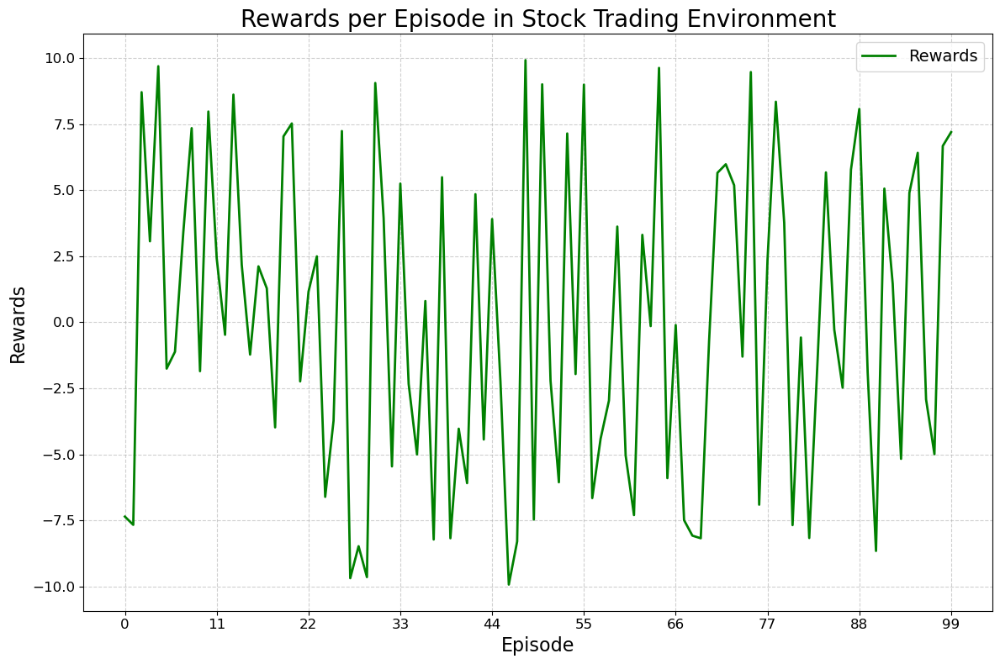

In [157]:

rewards_per_episode_plot(rewards_per_ep, environment_type='Stock Trading', epsilons=epsilon_values, smooth=True)


In [158]:
import matplotlib.pyplot as plt
import numpy as np

def epsilon_decay_plot(epsilon_values, environment_type):
    """
    Plots the epsilon decay over episodes in the stock trading environment.
    """
    if isinstance(epsilon_values, dict):
        epsilon_values = list(epsilon_values.values())

    plt.figure(figsize=(10, 6))
    plt.plot(epsilon_values, linestyle='-', markersize=4, color='blue', label='Epsilon Decay')
    plt.title(f'Epsilon Decay in {environment_type} Environment', fontsize=18)
    plt.xlabel('Episode', fontsize=14)
    plt.ylabel('Epsilon Value', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.show()


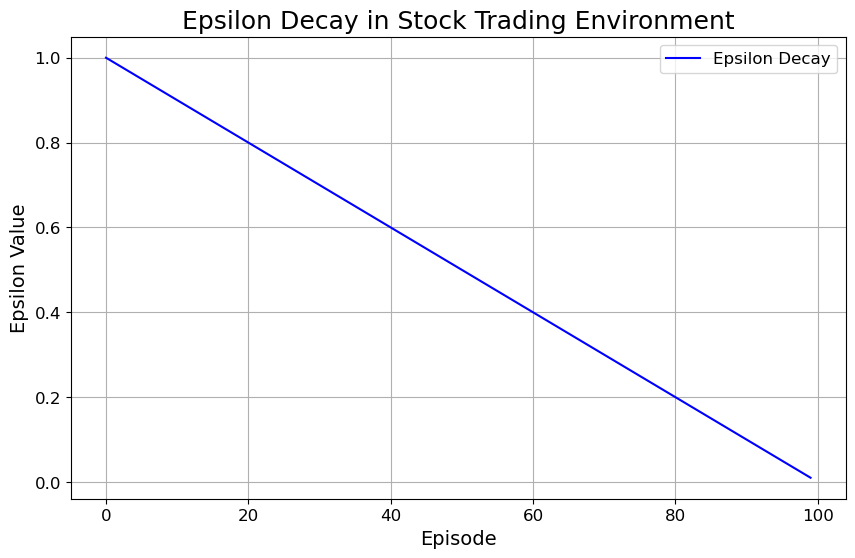

In [159]:
epsilon_decay_plot(epsilon_values, environment_type='Stock Trading')


# References: 
# a) Demo lecture by Dr. Alina (https://ubuffalo-my.sharepoint.com/personal/avereshc_buffalo_edu/_layouts/15/onedrive.aspx?id=%2Fpersonal%2Favereshc%5Fbuffalo%5Fedu%2FDocuments%2F2024%5FFall%5FRL%2F%5Fpublic%2FCourse%20Materials%2FRL%20Environment%20Demo&ga=1)
# b)Demo lecture by TA (https://ubuffalo-my.sharepoint.com/personal/avereshc_buffalo_edu/_layouts/15/onedrive.aspx?id=%2Fpersonal%2Favereshc%5Fbuffalo%5Fedu%2FDocuments%2F2024%5FFall%5FRL%2F%5Fpublic%2FCourse%20Materials%2FRL%20Environment%20Visualization&ga=1)
# c) Demo lecture by Dr. Alina ( Python demo tutorial for Multi-armed Bandit (MAB), https://piazza.com/class/m071wk03ok62ep/post/44)
# d) https://taraqur.medium.com/reinforcement-learning-2-agent-in-the-warehouse-ea07a605d3ff
# https://medium.com/@alwinraju/in-depth-guide-to-implementing-q-learning-in-python-with-openai-gyms-taxi-environment-cd356cc6a288
# Robotic Warehouse: https://github.com/semitable/robotic-warehouse
# Reinforcement Learning: Part 6: Temporal differencing (SARSA, Q learning, Expected SARSA) https://medium.com/@j13mehul/reinforcement-learning-part-6-temporal-differencing-sarsa-q-learning-expected-sarsa-b7725c755410
# Class lecture